# Descomposición en Valores Singulares — Reconstrucción de Imágenes

Verificación experimental del funcionamiento de SVD mediante descomposición y reconstrucción de imágenes a color en distintos espacios de color.

## Importaciones

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib import cm
from itertools import product
from PIL import Image
import cv2
import os
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
import plotly.io as pio
import plotly.graph_objects as go

# Crear template basado en plotly_dark
dark_template = go.layout.Template(pio.templates["plotly_dark"])

# -------- CONFIGURACIÓN GLOBAL --------

dark_template.layout = go.Layout(

    # Tamaño por default
    height=500,
    width=1000,

    # -------- TRANSPARENCIA TOTAL --------
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',

    # -------- FUENTES --------
    font=dict(color="white"),

    title=dict(
        font=dict(color="white")
    ),

    legend=dict(
        font=dict(color="white"),
        groupclick="toggleitem",
        bgcolor='rgba(0,0,0,0)'
    ),

    # -------- MÁRGENES --------
    margin=dict(
        l=10,
        r=10,
        t=40,
        b=10
    ),

    # -------- EJES --------
    xaxis=dict(
        title_font=dict(color="white"),
        tickfont=dict(color="white"),
        showgrid=True,
        zeroline=True,
        gridcolor='rgba(255,255,255,0.2)',
        griddash='dot'
    ),

    yaxis=dict(
        title_font=dict(color="white"),
        tickfont=dict(color="white"),
        showgrid=True,
        zeroline=True,
        gridcolor='rgba(255,255,255,0.2)',
        griddash='dot'
    )
)

# Registrar template
pio.templates["custom_dark"] = dark_template



In [3]:
# Activar modo oscuro en matplotlib
plt.style.use('dark_background')

# Activar modo oscuro en plotly
# Establecer como default global
pio.templates.default = "custom_dark"

## Funciones generales

In [4]:
def svd_full(matrix):
    """SVD completa de una matriz 2D."""
    U, S, Vt = np.linalg.svd(matrix, full_matrices=True)
    print(f"U={U.shape}, S={S.shape}, V={Vt.shape}")
    return U, S, Vt


def svd_reconstruct(U, S, Vt, k):
    """Reconstrucción truncada usando los primeros k valores singulares."""
    m, n = U.shape[0], Vt.shape[1]
    rec = np.zeros((m, n))
    for i in range(k):
        rec += S[i] * np.outer(U[:, i], Vt[i, :])
    return rec




def plot_histograms(img_rgb, color_spaces, show=True):

    results = []

    fig = make_subplots(
        rows=3,
        cols=2,
        column_widths=[0.35, 0.65],
        row_heights=[1/3, 1/3, 1/3],
        specs=[
            [{"rowspan": 3}, {}],
            [None, {}],
            [None, {}],
        ],
        horizontal_spacing=0.05,
        vertical_spacing=0.08
    )

    # Imagen
    fig.add_trace(
        go.Image(z=img_rgb),
        row=1,
        col=1
    )

    fig.update_xaxes(showticklabels=False, row=1, col=1)
    fig.update_yaxes(showticklabels=False, row=1, col=1)

    colors_default = ["red", "green", "blue"]
    colors_default = ["#FC8585", "#A2FA68", "#68BFFA"]


    for row_idx, (name, convert_fn) in enumerate(color_spaces, start=1):

        converted = img_rgb if convert_fn is None else convert_fn(img_rgb)

        channels = [converted[:, :, c] for c in range(3)]
        results.append(channels)

        for ch_idx, channel in enumerate(channels):

            hist = np.histogram(channel.ravel(), bins=256, range=(0, 255))[0]

            fig.add_trace(
                go.Scatter(
                    x=np.arange(256),
                    y=hist,
                    mode='lines',
                    name=f"{name}[{ch_idx}]",
                    legendgroup=f"{name}",
                    legendgrouptitle_text=f"{name}",
                    showlegend=True,
                    line=dict(color=colors_default[ch_idx]),
                    hovertemplate="Value: %{x}<br>Count: %{y}<extra></extra>"
                ),
                row=row_idx,
                col=2
            )

        fig.update_xaxes(
            range=[0, 255],
            title_text=name,
            row=row_idx,
            col=2
        )
    
    fig.update_layout(
    legend=dict(
        y=1,
        yanchor="top",
        tracegroupgap=70,   # aumenta este valor hasta alinear visualmente
        font=dict(color="white")
    )
    )


    
    fig.update_layout(margin=dict(b=60))
    fig.update_xaxes(title_standoff=10)
    

    if show:
        fig.show()

    return results, fig
def reconstruction_error(img_a, img_b, metric='mse'):
    """Error entre dos imágenes del mismo tamaño."""
    a = img_a.astype(np.float64)
    b = img_b.astype(np.float64)
    diff = a - b
    if metric == 'mse':
        return np.mean(diff ** 2)
    elif metric == 'mae':
        return np.mean(np.abs(diff))
    elif metric == 'rmse':
        return np.sqrt(np.mean(diff ** 2))
    elif metric == 'psnr':
        mse = np.mean(diff ** 2)
        if mse == 0:
            return float('inf')
        return 20 * np.log10(255.0 / np.sqrt(mse))
    else:
        raise ValueError(f"Métrica desconocida: {metric}")

## Carga de imágenes

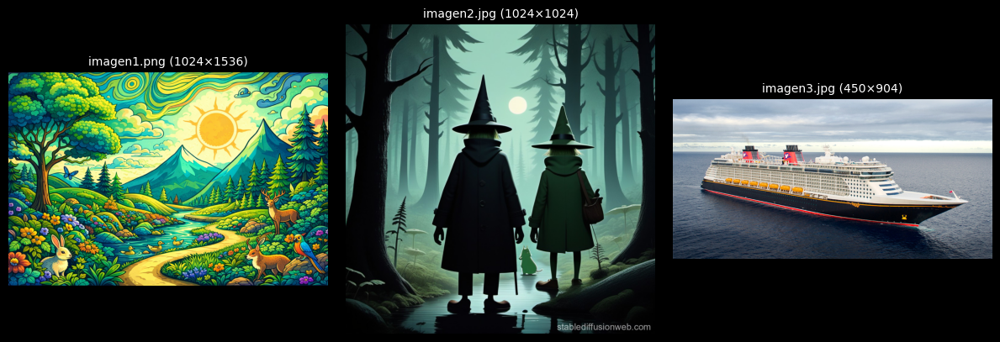

In [5]:
path = 'src/'
image_files = ['imagen1.png', 'imagen2.jpg', 'imagen3.jpg']
images_rgb = [np.array(Image.open(path+p).convert('RGB')) for p in image_files]

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, img, path in zip(axes, images_rgb, image_files):
    m, n = img.shape[:2]
    ax.imshow(img)
    ax.set_title(os.path.basename(path)+f" ({m}×{n})", fontsize=10)
    ax.axis('off')
    ax.set_facecolor('none')

plt.tight_layout()
plt.show()




## Definición de espacios de color

Se trabaja con RGB, HSV y YCbCr.

In [6]:
def to_hsv(img_rgb):
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

def to_ycbcr(img_rgb):
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)

color_spaces_def = [
    ('RGB', None),
    ('HSV', to_hsv),
    ('YCbCr', to_ycbcr),
]

## Histogramas por espacio de color

In [7]:
for i, img in enumerate(images_rgb):
    print(f"--- Imagen {i+1} ---")
    plot_histograms(img, color_spaces_def, show=True)

--- Imagen 1 ---


--- Imagen 2 ---


--- Imagen 3 ---


## Funciones auxiliares del experimento

In [8]:
def k_values(m, n, F=5, mode=None):
    """F valores enteros entre 3 y (m*n)//(m+n+1)."""
    min = 3
    max = (m*n)//(m+n+1)  # k máximo para que SVD reduzca almacenamiento
    
        
    if mode == 'exp' or F <= 10:
        vals = np.exp(np.linspace(0, np.log(max-1), F)) + min - 1
        vals = np.clip(vals, min, max)
        vals = np.floor(vals).astype(int).tolist()
        valid_vals = [vals[0]]
        for i in vals[1::]:
            if i <= valid_vals[-1]:
                valid_vals.append(i + abs(valid_vals[-1] - i)+1)
            else:
                valid_vals.append(i)
        
        return valid_vals
    else:
        return np.linspace(min, max, F, dtype=int).tolist()


def reconstruct_channels(channels, k_list):
    """
    SVD y reconstrucciones para cada canal.
    Retorna lista de SVDs y dict {k: [rec_ch0, rec_ch1, rec_ch2]}.
    """
    svds = []
    recs = {k: [] for k in k_list}
    for ch in channels:
        U, S, Vt = svd_full(ch.astype(np.float64))
        svds.append((U, S, Vt))
        for k in k_list:
            recs[k].append(svd_reconstruct(U, S, Vt, k))
    return svds, recs


def merge_channels(rec_list, clip=True):
    """Combina tres canales reconstruidos en imagen uint8."""
    img = np.stack(rec_list, axis=-1)
    if clip:
        img = np.clip(img, 0, 255)
    return img.astype(np.uint8)


def build_mosaic_grid(k_list, recs_per_ch, fixed_ch, fixed_k_idx, original_shape):
    """
    Cuadrícula F×F: canal fixed_ch fijado en k_list[fixed_k_idx],
    los otros dos canales varían.
    """
    F = len(k_list)
    other = [c for c in range(3) if c != fixed_ch]
    fixed_k = k_list[fixed_k_idx]
    rows = []
    for ki in k_list:
        row = []
        for kj in k_list:
            chs = [None, None, None]
            chs[fixed_ch] = recs_per_ch[fixed_k][fixed_ch]
            chs[other[0]] = recs_per_ch[ki][other[0]]
            chs[other[1]] = recs_per_ch[kj][other[1]]
            row.append(merge_channels(chs))
        rows.append(row)
    return rows


def show_mosaic(mosaic_rows, k_list, fixed_ch, fixed_k_idx, title_prefix=''):
    F = len(k_list)
    h, w = mosaic_rows[0][0].shape[:2]

    fig, axes = plt.subplots(
        F, F,
        figsize=(F * w / h, F),
        gridspec_kw={'wspace': 0.02, 'hspace': 0.02}
    )

    
    # fig, axes = plt.subplots(F, F, figsize=(F , F ))
    for i, row in enumerate(mosaic_rows):
        for j, img in enumerate(row):
            axes[i, j].imshow(img, aspect='auto')
            axes[i, j].axis('off')
    ch_names = ['R', 'G', 'B']

    fig.suptitle(
        f"{title_prefix} | {ch_names[fixed_ch]}=k{k_list[fixed_k_idx]}",
        fontsize=10,
        y=0.98
    )

    plt.subplots_adjust(
        left=0,
        right=1,
        bottom=0,
        top=0.94,   # espacio reservado para el título
        wspace=0.02,
        hspace=0.02
    )

    plt.show()


def error_curves(channels_orig, recs_per_ch, k_list, metric='mse'):
    """Errores por canal y error total de imagen reconstruida."""
    ch_errors = [[], [], []]
    total_errors = []
    for k in k_list:
        rec_img = merge_channels(recs_per_ch[k])
        orig_img = merge_channels([c.astype(np.float64) for c in channels_orig])
        total_errors.append(reconstruction_error(orig_img, rec_img, metric))
        for c in range(3):
            ch_errors[c].append(
                reconstruction_error(
                    channels_orig[c].astype(np.float64),
                    recs_per_ch[k][c],
                    metric
                )
            )
    return ch_errors, total_errors


def svd_storage_count(m, n, k):
    """Número de elementos almacenados en la representación truncada."""
    return k * (m + 1 + n)

def knee_point(x, y):
    x = np.array(x)
    y = np.array(y)

    # línea entre extremos
    p1 = np.array([x[0], y[0]])
    p2 = np.array([x[-1], y[-1]])

    # vector línea
    line_vec = p2 - p1
    line_vec = line_vec / np.linalg.norm(line_vec)

    # vectores desde p1
    vecs = np.vstack((x - p1[0], y - p1[1])).T

    # proyección
    proj = np.dot(vecs, line_vec)
    proj_point = np.outer(proj, line_vec)

    # distancia perpendicular
    dist = np.linalg.norm(vecs - proj_point, axis=1)

    idx = np.argmax(dist)
    
    return x[idx], y[idx], idx

def plot_error_2d(k_list, ch_errors, ch_labels, knee_k_idx, title=''):

    default_colors = ["#FC8585", "#A2FA68", "#68BFFA"]
    fig = go.Figure()
    for errors, label, k_idx in zip(ch_errors, ch_labels, knee_k_idx):
        fig.add_trace(go.Scatter(
            x=k_list,
            y=errors,
            mode='lines+markers',
            name=label,
            line=dict(color=default_colors[ch_labels.index(label)]),
            marker=dict(size=8)
        ))
        # marcar el punto de la rodilla con una anotación
        fig.add_annotation(
            x=k_list[k_idx],
            y=errors[k_idx],
            text='knee',
            showarrow=True,
            arrowhead=2,
            ax=-30,
            ay=-30  # desplazar la etiqueta hacia arriba
        )

    fig.update_layout(
        title=title,
        xaxis_title='K',
        yaxis_title='Error (MSE)',
        legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
        width=900,
        height=400
    )
    fig.show()


def plot_error_3d(k_list, recs_per_ch, channels_orig, metric='mse', knee_k_idx=None, title=''):
    """Superficie 3D: ejes = K por canal, color/tamaño = error total."""
    import plotly.graph_objects as go
    
    combs = list(product(k_list, repeat=3))
    errors = []
    for k0, k1, k2 in combs:
        chs = [recs_per_ch[k0][0], recs_per_ch[k1][1], recs_per_ch[k2][2]]
        rec = merge_channels(chs)
        orig = merge_channels([c.astype(np.float64) for c in channels_orig])
        errors.append(reconstruction_error(orig, rec, metric))

    errors = np.array(errors)
    xs = [c[0] for c in combs]
    ys = [c[1] for c in combs]
    zs = [c[2] for c in combs]

    # índices de error de rodilla para cada canal
    ch_opt = [k_list[knee_k_idx[c]] for c in range(3)] if knee_k_idx is not None else [k_list[0], k_list[0], k_list[0]]
    
    fig = go.Figure()
    
    # Scatter plot
    fig.add_trace(go.Scatter3d(
        x=xs, y=ys, z=zs,
        mode='markers',
        marker=dict(
            size=errors / errors.max() * 25 + 3,
            color=errors,
            colorscale='Viridis',
            showscale=True,
            colorbar=dict(title='Error')
        ),
        text=[f'Error: {e:.2f}' for e in errors],
        hoverinfo='text'
    ))
    
    # planos en valores óptimos
    k_arr = np.array(k_list)
    kk = np.meshgrid(k_arr, k_arr)
    
    # Plano z=ch_opt[2]
    fig.add_trace(go.Surface(
        x=kk[0], y=kk[1], z=np.full_like(kk[0], ch_opt[2], dtype=float),
        opacity=0.4, colorscale='Reds', showscale=False, name='Z plane'
    ))
    
    # Plano y=ch_opt[1]
    fig.add_trace(go.Surface(
        x=kk[0], y=np.full_like(kk[0], ch_opt[1], dtype=float), z=kk[1],
        opacity=0.4, colorscale='Greens', showscale=False, name='Y plane'
    ))
    
    # Plano x=ch_opt[0]
    fig.add_trace(go.Surface(
        x=np.full_like(kk[0], ch_opt[0], dtype=float), y=kk[0], z=kk[1],
        opacity=0.4, colorscale='Blues', showscale=False, name='X plane'
    ))
    
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='K ch0',
            yaxis_title='K ch1',
            zaxis_title='K ch2'
        ),
        width=900,
        height=700
    )
    
    fig.show()


def show_reconstruction_grid(original, cs_name, recs_per_ch, k_list, total_errors,
                             knee_k_idx, title_prefix=''):
    """Cuadrícula 2×2: original, peor, mejor, promedio."""
    
    m,n = original.shape[:2]
    best_k = k_list[np.argmin(total_errors)]
    best_k_percentage = (3 * svd_storage_count(m, n, best_k)) / (3 * m * n) * 100
    worst_k = k_list[np.argmax(total_errors)]
    worst_k_percentage = (3 * svd_storage_count(m, n, worst_k)) / (3 * m * n) * 100

    imgs = {
        f'Original, [{m}x{n}]': original,
        f'Peor (K={worst_k}, {worst_k_percentage:.1f}%)': merge_channels(recs_per_ch[worst_k]),
        f'Mejor (K={best_k}, {best_k_percentage:.1f}%)': merge_channels(recs_per_ch[best_k])
    }
    
    # Renconstruye con el punto de la rodilla para cada canal

    knee_k_values = [k_list[knee_k_idx[c]] for c in range(3)]
    knee_channels = [recs_per_ch[knee_k_values[c]][c] for c in range(3)]
    knee_k_percentage = svd_storage_count(m, n, np.array(knee_k_values)).sum() / (3 * m * n) * 100
    knee_img = merge_channels(knee_channels)
    imgs[f'Knee Point (K={knee_k_values}, {knee_k_percentage:.1f}%)'] = knee_img
        
        

    fig, axes = plt.subplots(2, 2, figsize=(8, 6))
    for ax, (title, img) in zip(axes.ravel(), imgs.items()):
        if cs_name in ['HSV', 'YCbCr']:
            # Convertir de nuevo a RGB para mostrar
            if cs_name == 'HSV':
                img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB)
            elif cs_name == 'YCbCr':
                img = cv2.cvtColor(img, cv2.COLOR_YCrCb2RGB)
        ax.imshow(img)
        ax.set_title(title, fontsize=9)
        ax.axis('off')
    fig.suptitle(title_prefix, fontsize=11)
    plt.tight_layout()
    plt.show()
    


## Función principal del experimento

In [9]:
# img_rgb = images_rgb[0]
# convert_fn = None
# cs_name = 'RGB'
# img_label = 'Imagen 1'
# metric='rmse'
# F=10
def run_experiment(img_rgb, convert_fn, cs_name, img_label, F=30, metric='rmse'):
    """
    Ejecuta el experimento completo SVD para una imagen y un espacio de color.
    """
    if convert_fn is not None:
        img_cs = convert_fn(img_rgb)
    else:
        img_cs = img_rgb.copy()

    channels = [img_cs[:, :, c].astype(np.float64) for c in range(3)]
    m, n = channels[0].shape
    k_list = k_values(m, n, F)

    print(f"\n{'='*60}")
    print(f"{img_label} | Espacio: {cs_name} | K={k_list}")
    print(f"{'='*60}")

    svds, recs = reconstruct_channels(channels, k_list)

    # mosaicos por canal fijo
    ch_names = [f"ch0", f"ch1", f"ch2"]
    # for fixed_ch in range(3):
    # fixed_ch = 2
    # for fixed_k_idx in range(F):
    #     mosaic = build_mosaic_grid(k_list, recs, fixed_ch, fixed_k_idx, (m, n))
    #     show_mosaic(mosaic, k_list, fixed_ch, fixed_k_idx,
    #                 title_prefix=f"{img_label} | {cs_name}")

    ch_errors, total_errors = error_curves(channels, recs, k_list, metric)

    # Punto de la rodilla para cada canal
    knee_k_idx = [int(knee_point(k_list, ch_errors[c])[2]) for c in range(3)]

    # Elementos almacenados por k, print with line breaks
    storage = [svd_storage_count(m, n, k)/(m*n)*100 for k in k_list]
    print(f"Elementos almacenados por canal:")
    for k, s in zip(k_list, storage):
        print(f"K={k}: {s:.2f}%")

    # gráfica 2D
    plot_error_2d(k_list, ch_errors, ch_names, knee_k_idx,
                    title=f"{img_label} | {cs_name} — Error por canal")

    # # gráfica 3D
    # plot_error_3d(k_list, recs, channels, metric, knee_k_idx,
    #                 title=f"{img_label} | {cs_name} — Error combinaciones")

    # cuadrícula 2×2 comparativa
    show_reconstruction_grid(
        img_cs, cs_name, recs, k_list, total_errors, knee_k_idx,
        title_prefix=f"{img_label} | {cs_name}"
    )

---

# Imagen 1 — Experimentos

In [10]:
# m = 1024
# n = 1536
# k = 149
# a = m*n*3
# b = 3*(m+n+1)*k
# print(a,b,b/a*100)

<details><summary>Imagen 1 — RGB</summary>


Imagen 1 | Espacio: RGB | K=[3, 24, 45, 66, 87, 108, 129, 150, 171, 192, 213, 234, 255, 276, 297, 319, 340, 361, 382, 403, 424, 445, 466, 487, 508, 529, 550, 571, 592, 614]
U=(1024, 1024), S=(1024,), V=(1536, 1536)
U=(1024, 1024), S=(1024,), V=(1536, 1536)
U=(1024, 1024), S=(1024,), V=(1536, 1536)
Elementos almacenados por canal:
K=3: 0.49%
K=24: 3.91%
K=45: 7.33%
K=66: 10.75%
K=87: 14.17%
K=108: 17.58%
K=129: 21.00%
K=150: 24.42%
K=171: 27.84%
K=192: 31.26%
K=213: 34.68%
K=234: 38.10%
K=255: 41.52%
K=276: 44.94%
K=297: 48.36%
K=319: 51.94%
K=340: 55.36%
K=361: 58.78%
K=382: 62.20%
K=403: 65.62%
K=424: 69.04%
K=445: 72.46%
K=466: 75.88%
K=487: 79.30%
K=508: 82.71%
K=529: 86.13%
K=550: 89.55%
K=571: 92.97%
K=592: 96.39%
K=614: 99.97%


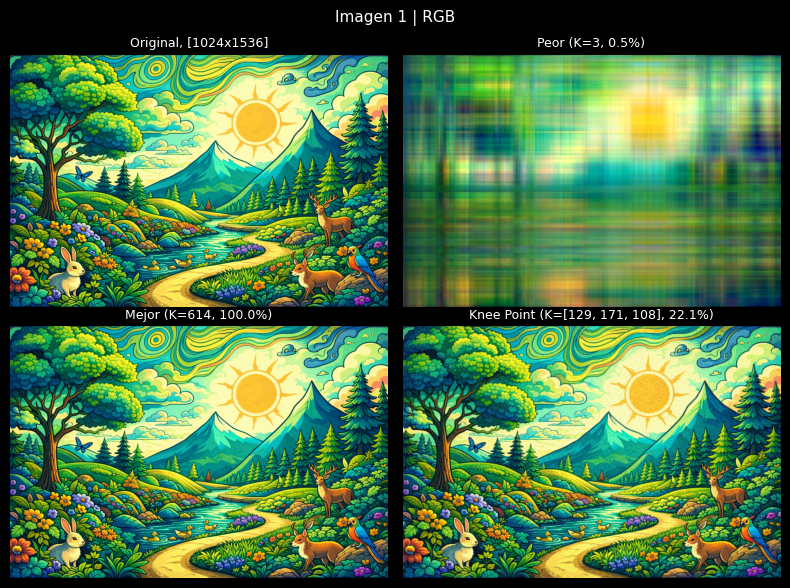

In [11]:
run_experiment(images_rgb[0], None, 'RGB', 'Imagen 1', )                                                                                                                                             

</details>

<details><summary>Imagen 1 — HSV</summary>


Imagen 1 | Espacio: HSV | K=[3, 24, 45, 66, 87, 108, 129, 150, 171, 192, 213, 234, 255, 276, 297, 319, 340, 361, 382, 403, 424, 445, 466, 487, 508, 529, 550, 571, 592, 614]
U=(1024, 1024), S=(1024,), V=(1536, 1536)
U=(1024, 1024), S=(1024,), V=(1536, 1536)
U=(1024, 1024), S=(1024,), V=(1536, 1536)
Elementos almacenados por canal:
K=3: 0.49%
K=24: 3.91%
K=45: 7.33%
K=66: 10.75%
K=87: 14.17%
K=108: 17.58%
K=129: 21.00%
K=150: 24.42%
K=171: 27.84%
K=192: 31.26%
K=213: 34.68%
K=234: 38.10%
K=255: 41.52%
K=276: 44.94%
K=297: 48.36%
K=319: 51.94%
K=340: 55.36%
K=361: 58.78%
K=382: 62.20%
K=403: 65.62%
K=424: 69.04%
K=445: 72.46%
K=466: 75.88%
K=487: 79.30%
K=508: 82.71%
K=529: 86.13%
K=550: 89.55%
K=571: 92.97%
K=592: 96.39%
K=614: 99.97%


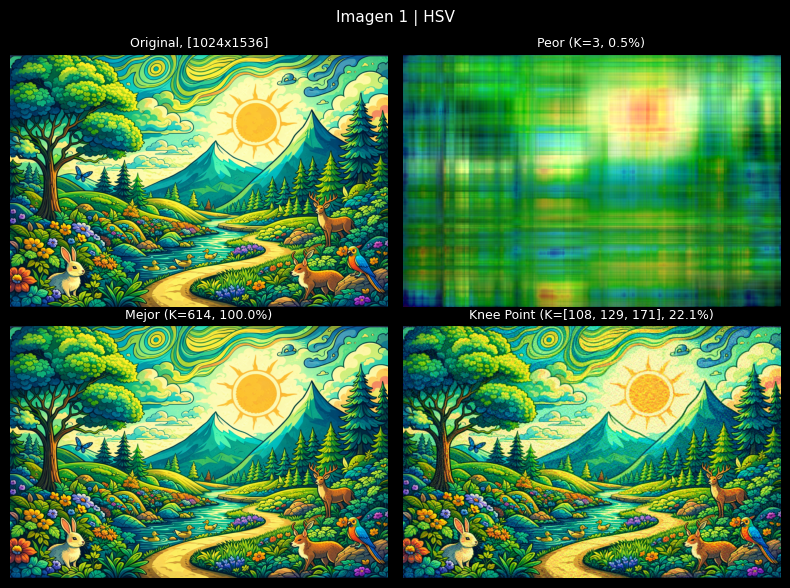

In [12]:
run_experiment(images_rgb[0], to_hsv, 'HSV', 'Imagen 1')

</details>

<details><summary>Imagen 1 — YCbCr</summary>


Imagen 1 | Espacio: YCbCr | K=[3, 24, 45, 66, 87, 108, 129, 150, 171, 192, 213, 234, 255, 276, 297, 319, 340, 361, 382, 403, 424, 445, 466, 487, 508, 529, 550, 571, 592, 614]
U=(1024, 1024), S=(1024,), V=(1536, 1536)
U=(1024, 1024), S=(1024,), V=(1536, 1536)
U=(1024, 1024), S=(1024,), V=(1536, 1536)
Elementos almacenados por canal:
K=3: 0.49%
K=24: 3.91%
K=45: 7.33%
K=66: 10.75%
K=87: 14.17%
K=108: 17.58%
K=129: 21.00%
K=150: 24.42%
K=171: 27.84%
K=192: 31.26%
K=213: 34.68%
K=234: 38.10%
K=255: 41.52%
K=276: 44.94%
K=297: 48.36%
K=319: 51.94%
K=340: 55.36%
K=361: 58.78%
K=382: 62.20%
K=403: 65.62%
K=424: 69.04%
K=445: 72.46%
K=466: 75.88%
K=487: 79.30%
K=508: 82.71%
K=529: 86.13%
K=550: 89.55%
K=571: 92.97%
K=592: 96.39%
K=614: 99.97%


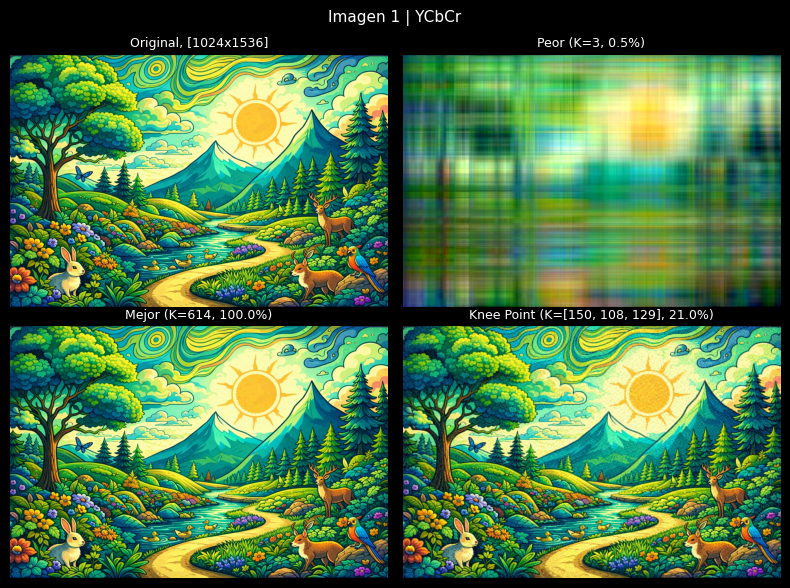

In [13]:
run_experiment(images_rgb[0], to_ycbcr, 'YCbCr', 'Imagen 1')

</details>

---

# Imagen 2 — Experimentos

<details><summary>Imagen 2 — RGB</summary>


Imagen 2 | Espacio: RGB | K=[3, 20, 38, 55, 73, 90, 108, 125, 143, 160, 178, 195, 213, 230, 248, 265, 283, 300, 318, 335, 353, 370, 388, 405, 423, 440, 458, 475, 493, 511]
U=(1024, 1024), S=(1024,), V=(1024, 1024)
U=(1024, 1024), S=(1024,), V=(1024, 1024)
U=(1024, 1024), S=(1024,), V=(1024, 1024)
Elementos almacenados por canal:
K=3: 0.59%
K=20: 3.91%
K=38: 7.43%
K=55: 10.75%
K=73: 14.26%
K=90: 17.59%
K=108: 21.10%
K=125: 24.43%
K=143: 27.94%
K=160: 31.27%
K=178: 34.78%
K=195: 38.10%
K=213: 41.62%
K=230: 44.94%
K=248: 48.46%
K=265: 51.78%
K=283: 55.30%
K=300: 58.62%
K=318: 62.14%
K=335: 65.46%
K=353: 68.98%
K=370: 72.30%
K=388: 75.82%
K=405: 79.14%
K=423: 82.66%
K=440: 85.98%
K=458: 89.50%
K=475: 92.82%
K=493: 96.34%
K=511: 99.85%


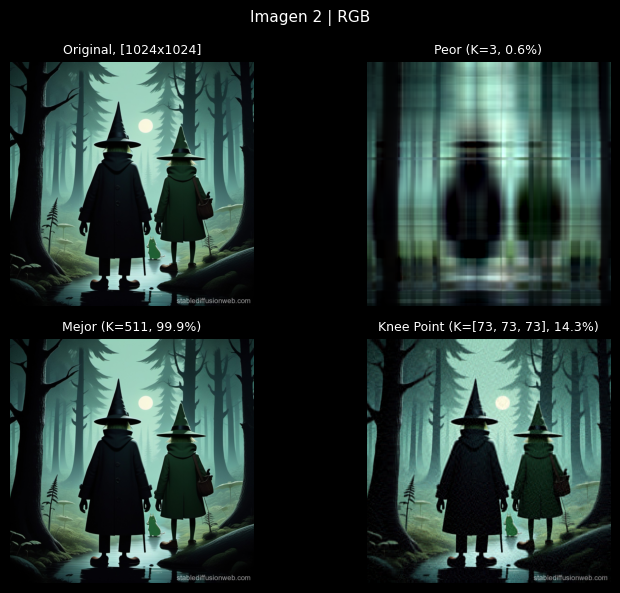

In [14]:
run_experiment(images_rgb[1], None, 'RGB', 'Imagen 2')

</details>

<details><summary>Imagen 2 — HSV</summary>


Imagen 2 | Espacio: HSV | K=[3, 20, 38, 55, 73, 90, 108, 125, 143, 160, 178, 195, 213, 230, 248, 265, 283, 300, 318, 335, 353, 370, 388, 405, 423, 440, 458, 475, 493, 511]
U=(1024, 1024), S=(1024,), V=(1024, 1024)
U=(1024, 1024), S=(1024,), V=(1024, 1024)
U=(1024, 1024), S=(1024,), V=(1024, 1024)
Elementos almacenados por canal:
K=3: 0.59%
K=20: 3.91%
K=38: 7.43%
K=55: 10.75%
K=73: 14.26%
K=90: 17.59%
K=108: 21.10%
K=125: 24.43%
K=143: 27.94%
K=160: 31.27%
K=178: 34.78%
K=195: 38.10%
K=213: 41.62%
K=230: 44.94%
K=248: 48.46%
K=265: 51.78%
K=283: 55.30%
K=300: 58.62%
K=318: 62.14%
K=335: 65.46%
K=353: 68.98%
K=370: 72.30%
K=388: 75.82%
K=405: 79.14%
K=423: 82.66%
K=440: 85.98%
K=458: 89.50%
K=475: 92.82%
K=493: 96.34%
K=511: 99.85%


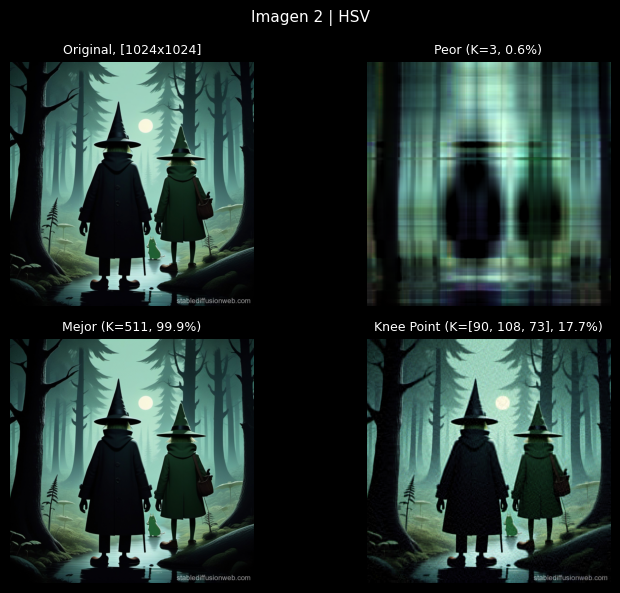

In [15]:
run_experiment(images_rgb[1], to_hsv, 'HSV', 'Imagen 2')

</details>

<details><summary>Imagen 2 — YCbCr</summary>


Imagen 2 | Espacio: YCbCr | K=[3, 20, 38, 55, 73, 90, 108, 125, 143, 160, 178, 195, 213, 230, 248, 265, 283, 300, 318, 335, 353, 370, 388, 405, 423, 440, 458, 475, 493, 511]
U=(1024, 1024), S=(1024,), V=(1024, 1024)
U=(1024, 1024), S=(1024,), V=(1024, 1024)
U=(1024, 1024), S=(1024,), V=(1024, 1024)
Elementos almacenados por canal:
K=3: 0.59%
K=20: 3.91%
K=38: 7.43%
K=55: 10.75%
K=73: 14.26%
K=90: 17.59%
K=108: 21.10%
K=125: 24.43%
K=143: 27.94%
K=160: 31.27%
K=178: 34.78%
K=195: 38.10%
K=213: 41.62%
K=230: 44.94%
K=248: 48.46%
K=265: 51.78%
K=283: 55.30%
K=300: 58.62%
K=318: 62.14%
K=335: 65.46%
K=353: 68.98%
K=370: 72.30%
K=388: 75.82%
K=405: 79.14%
K=423: 82.66%
K=440: 85.98%
K=458: 89.50%
K=475: 92.82%
K=493: 96.34%
K=511: 99.85%


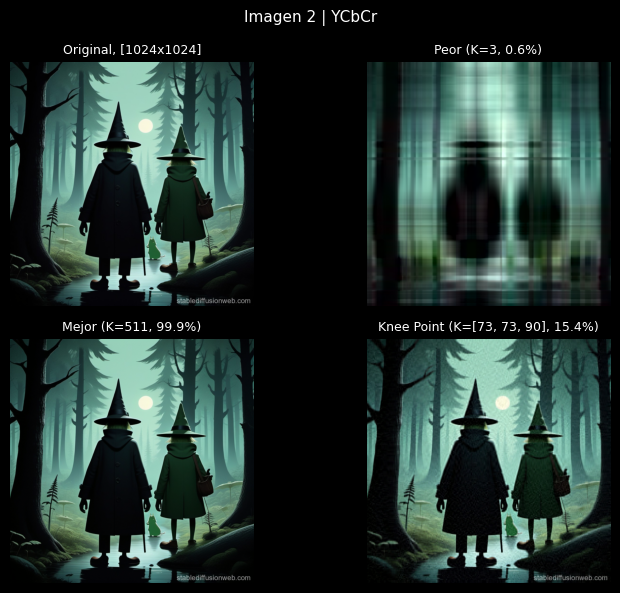

In [16]:
run_experiment(images_rgb[1], to_ycbcr, 'YCbCr', 'Imagen 2')

</details>

---

# Imagen 3 — Experimentos

<details><summary>Imagen 3 — RGB</summary>


Imagen 3 | Espacio: RGB | K=[3, 13, 23, 33, 43, 54, 64, 74, 84, 95, 105, 115, 125, 136, 146, 156, 166, 177, 187, 197, 207, 218, 228, 238, 248, 259, 269, 279, 289, 300]
U=(450, 450), S=(450,), V=(904, 904)
U=(450, 450), S=(450,), V=(904, 904)
U=(450, 450), S=(450,), V=(904, 904)
Elementos almacenados por canal:
K=3: 1.00%
K=13: 4.33%
K=23: 7.66%
K=33: 10.99%
K=43: 14.32%
K=54: 17.99%
K=64: 21.32%
K=74: 24.65%
K=84: 27.98%
K=95: 31.64%
K=105: 34.97%
K=115: 38.31%
K=125: 41.64%
K=136: 45.30%
K=146: 48.63%
K=156: 51.96%
K=166: 55.29%
K=177: 58.96%
K=187: 62.29%
K=197: 65.62%
K=207: 68.95%
K=218: 72.61%
K=228: 75.94%
K=238: 79.27%
K=248: 82.61%
K=259: 86.27%
K=269: 89.60%
K=279: 92.93%
K=289: 96.26%
K=300: 99.93%


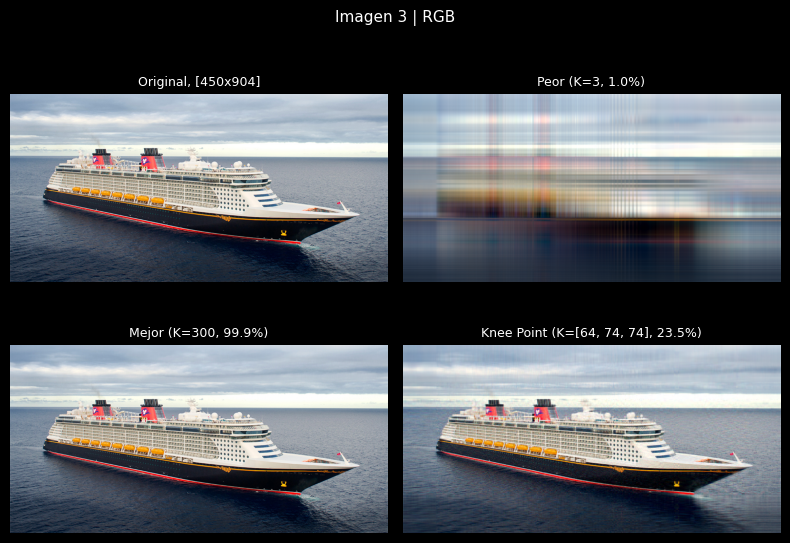

In [17]:
run_experiment(images_rgb[2], None, 'RGB', 'Imagen 3')

</details>

<details><summary>Imagen 3 — HSV</summary>


Imagen 3 | Espacio: HSV | K=[3, 13, 23, 33, 43, 54, 64, 74, 84, 95, 105, 115, 125, 136, 146, 156, 166, 177, 187, 197, 207, 218, 228, 238, 248, 259, 269, 279, 289, 300]
U=(450, 450), S=(450,), V=(904, 904)
U=(450, 450), S=(450,), V=(904, 904)
U=(450, 450), S=(450,), V=(904, 904)
Elementos almacenados por canal:
K=3: 1.00%
K=13: 4.33%
K=23: 7.66%
K=33: 10.99%
K=43: 14.32%
K=54: 17.99%
K=64: 21.32%
K=74: 24.65%
K=84: 27.98%
K=95: 31.64%
K=105: 34.97%
K=115: 38.31%
K=125: 41.64%
K=136: 45.30%
K=146: 48.63%
K=156: 51.96%
K=166: 55.29%
K=177: 58.96%
K=187: 62.29%
K=197: 65.62%
K=207: 68.95%
K=218: 72.61%
K=228: 75.94%
K=238: 79.27%
K=248: 82.61%
K=259: 86.27%
K=269: 89.60%
K=279: 92.93%
K=289: 96.26%
K=300: 99.93%


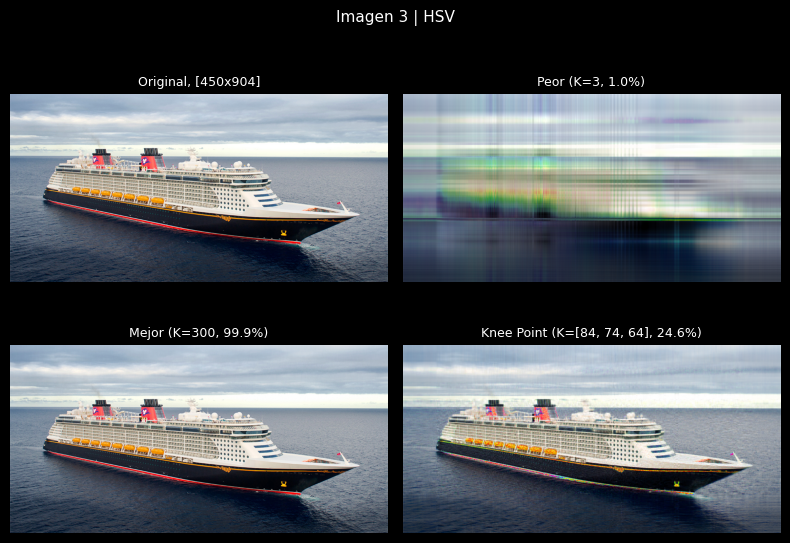

In [18]:
run_experiment(images_rgb[2], to_hsv, 'HSV', 'Imagen 3')

</details>

<details><summary>Imagen 3 — YCbCr</summary>


Imagen 3 | Espacio: YCbCr | K=[3, 13, 23, 33, 43, 54, 64, 74, 84, 95, 105, 115, 125, 136, 146, 156, 166, 177, 187, 197, 207, 218, 228, 238, 248, 259, 269, 279, 289, 300]
U=(450, 450), S=(450,), V=(904, 904)
U=(450, 450), S=(450,), V=(904, 904)
U=(450, 450), S=(450,), V=(904, 904)
Elementos almacenados por canal:
K=3: 1.00%
K=13: 4.33%
K=23: 7.66%
K=33: 10.99%
K=43: 14.32%
K=54: 17.99%
K=64: 21.32%
K=74: 24.65%
K=84: 27.98%
K=95: 31.64%
K=105: 34.97%
K=115: 38.31%
K=125: 41.64%
K=136: 45.30%
K=146: 48.63%
K=156: 51.96%
K=166: 55.29%
K=177: 58.96%
K=187: 62.29%
K=197: 65.62%
K=207: 68.95%
K=218: 72.61%
K=228: 75.94%
K=238: 79.27%
K=248: 82.61%
K=259: 86.27%
K=269: 89.60%
K=279: 92.93%
K=289: 96.26%
K=300: 99.93%


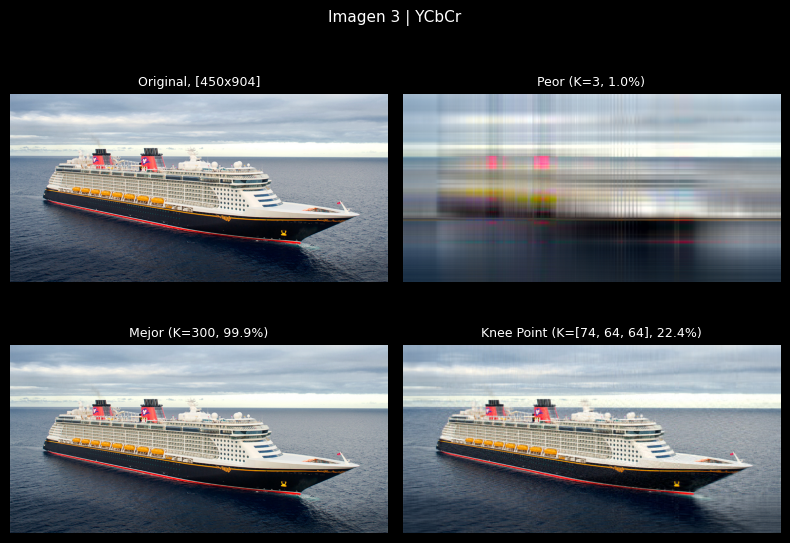

In [19]:
run_experiment(images_rgb[2], to_ycbcr, 'YCbCr', 'Imagen 3')

</details>